# Bicycle trajectory forecasting in Bologna

## 1 - Data processing

In this Notebook we take a look at our database, which contains some anonymised tracks of cyclists moving across the city of Bologna during the spring and summer of 2017.

The data were previously processed, and we obtain them as sequences of integers, representing 200 m * 200 m squares
in a 40 * 56 rectangular grid spanning from (lat, lon) to (lat, lon), over Bologna.
The sequences represent a sampling performed every 10 s. 

In this sense, if an integer is repeated N times within a sequence, we understand that the correspondent cyclist's trajectory has fallen within the associated square for a time of N * 10 s.

We are interested in the prevision of the geometry of the trajectory, so we want to extrapolate, given a portion of it, a forecast for the next grid cell visited.

This notebook has been used to explore the data and cast it in useful forms for the training of machine learning algorithms.

First, let us import some useful modules and set some paths to the data.

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import os
import numpy as np

In [2]:
datafolder = "/home/giulio/DATI/encoded_200_data/"
files = os.listdir(datafolder)
files.sort()

In [3]:
for f in files:
    print(f)

04a_encoded_200.csv
04b_encoded_200.csv
05a_encoded_200.csv
05b_encoded_200.csv
06a_encoded_200.csv
06b_encoded_200.csv
07a_encoded_200.csv
07b_encoded_200.csv
08a_encoded_200.csv
08b_encoded_200.csv
09a_encoded_200.csv
09b_encoded_200.csv


The data is broken down into roughly bi-weekly files. With the available computing power it has been possible
to process only a single month at a time, as an example in the following we will consider the month of May (files ```05a_encoded_200.csv``` and ```05b_encoded_200.csv```), but changing the slicing indices in the initialisation of ```aggregate_files```  allows the processing and aggregation of any combination of the bi-weekly files.

In [4]:
li = []

aggregate_files = files[2:4]

print(aggregate_files)

for filename in aggregate_files:
    df = pd.read_csv(datafolder+filename)
    li.append(df)

ed = pd.concat(li, axis=0, ignore_index=True)

ed

['09a_encoded_200.csv', '09b_encoded_200.csv']


,Activity,Type,Timestamp,Coding
0,3040396,0,1.504231e+09,662
1,3040396,0,1.504231e+09,662
2,3040396,0,1.504231e+09,662
3,3040396,0,1.504231e+09,662
4,3040396,0,1.504231e+09,662
...,...,...,...,...
15126148,3375295,1,1.506796e+09,1280
15126149,3375295,1,1.506796e+09,1280
15126150,3375295,1,1.506796e+09,1280
15126151,3375295,1,1.506796e+09,1280


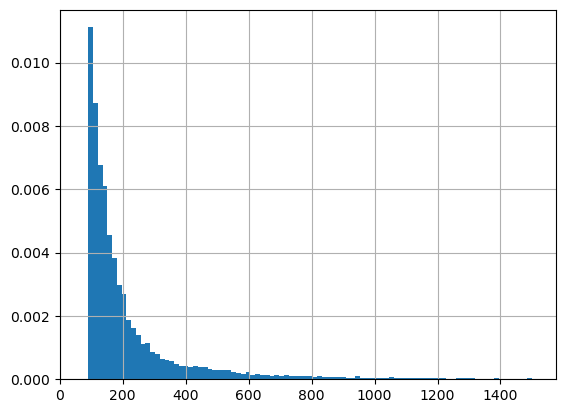

In [5]:
#ed = results

#e_pedestrian_trips = {k : trip.to_numpy() for k, trip in ed.groupby(ed.Activity) if trip.Type.iloc[0] == 0}
e_bike_trips       = {k : trip.to_numpy() for k, trip in ed.groupby(ed.Activity) if trip.Type.iloc[0] == 1}

#e_pedestrian_points= np.array([t.shape[0] for t in e_pedestrian_trips.values()])
e_bike_points      = np.array([t.shape[0] for t in e_bike_trips.values()])
efig, eax = plt.subplots()
#plt.hist(e_pedestrian_points, bins = np.linspace(0, 1500, 100), density = True)
plt.hist(e_bike_points, bins = np.linspace(0, 1500, 100), density = True)
plt.xlim(left = 0)
plt.grid(True)
#e_pedestrian_points.min()

In [6]:
#e_pedestrian_seqs = {k : trip[:,3] for k, trip in e_pedestrian_trips.items()}
e_bike_seqs = {k : trip[:,3] for k, trip in e_bike_trips.items()}

from more_itertools import unique_justseen

#e_pedestrian_unique_seqs = {k : np.fromiter(unique_justseen(trip), dtype = int) for k, trip in e_pedestrian_seqs.items()}
e_bike_unique_seqs       = {k : np.fromiter(unique_justseen(trip), dtype = int) for k, trip in e_bike_seqs.items()}

#e_unique_pedestrian_points = np.array([t.shape[0] for t in e_pedestrian_unique_seqs.values()])
e_unique_bike_points = np.array([t.shape[0] for t in e_bike_unique_seqs.values()])

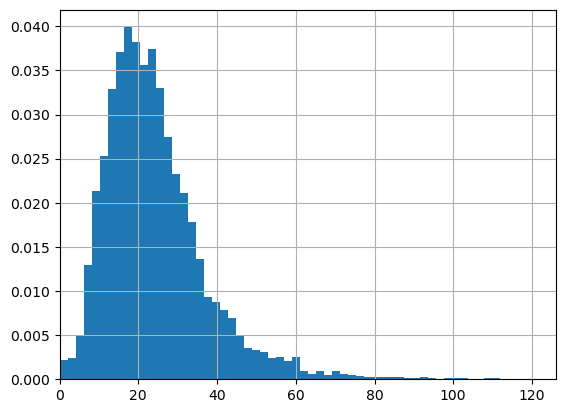

In [7]:
e_unique_fig, e_unique_ax = plt.subplots()

#plt.hist(e_unique_pedestrian_points, bins = np.linspace(0, 120, 60), density = True)
plt.hist(e_unique_bike_points, bins = np.linspace(0, 120, 60), density = True)
plt.xlim(left = 0)
plt.grid(True)

In [8]:
threshold = 12
pred      = 1
(sum(e_unique_bike_points < threshold), sum(e_unique_bike_points >= threshold))

(1780, 14067)

In [9]:
sufficient_bike_seqs = {k : seq for k, seq in e_bike_unique_seqs.items() if len(seq) >= threshold}

In [10]:
processed_bike_seqs = []

for seq in sufficient_bike_seqs.values():
    n_useful_seqs = int(np.floor(len(seq) - threshold + 1)/pred)
    for i in range(n_useful_seqs):
        sseq = np.roll(seq, -i * pred)[:threshold]
        processed_bike_seqs.append(sseq)

In [11]:
max_n = max([max(seq) for seq in processed_bike_seqs])
max_n

2278

In [12]:
def to_scaled(n):
    return np.array([2 * (n % 57) / 57 -1 , - 2 * (n // 57) / 40 + 1])
to_scaled(np.array([it for it in processed_bike_seqs[0]]))

array([[0.33333333, 0.29824561, 0.29824561, 0.26315789, 0.26315789,
        0.22807018, 0.22807018, 0.19298246, 0.19298246, 0.19298246,
        0.15789474, 0.15789474],
       [0.55      , 0.55      , 0.5       , 0.45      , 0.4       ,
        0.4       , 0.35      , 0.35      , 0.3       , 0.25      ,
        0.25      , 0.2       ]])

In [13]:
final_array = np.array(processed_bike_seqs)

final_bidimensional = 10 * np.array(to_scaled(final_array))
final_bidimensional[0]

array([[ 3.33333333,  2.98245614,  2.98245614, ...,  1.92982456,
         1.57894737,  1.57894737],
       [ 2.98245614,  2.98245614,  2.63157895, ...,  1.57894737,
         1.57894737,  1.57894737],
       [ 2.98245614,  2.63157895,  2.63157895, ...,  1.57894737,
         1.57894737,  1.57894737],
       ...,
       [ 4.38596491,  4.38596491,  4.73684211, ...,  5.43859649,
         5.0877193 ,  5.0877193 ],
       [ 4.38596491,  4.73684211,  4.73684211, ...,  5.0877193 ,
         5.0877193 ,  5.0877193 ],
       [ 0.87719298,  0.52631579,  0.52631579, ..., -0.52631579,
        -0.87719298, -0.87719298]])

(array([  8363.,  39673.,  98592., 261400., 519563., 918413., 504508.,
        180616.,  58358.,   7866.]),
 array([-0.97103993, -0.77402369, -0.57700746, -0.37999122, -0.18297499,
         0.01404125,  0.21105748,  0.40807372,  0.60508995,  0.80210619,
         0.99912242]),
 <BarContainer object of 10 artists>)

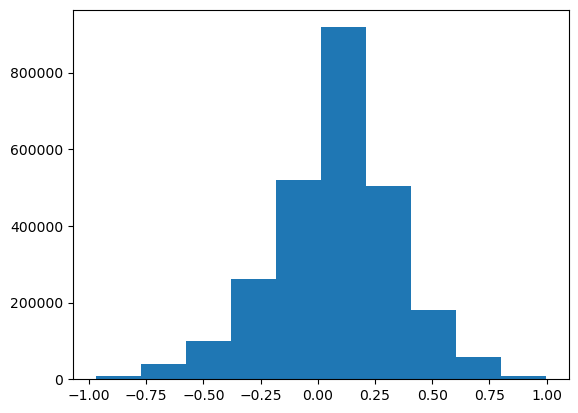

In [14]:
scaled_final_array = 2 * final_array / 2279 -1
plt.hist(scaled_final_array.flatten())

In [15]:
import csv

with open("./preproc/september_encoded_bike.csv", mode="w") as fout:
    wr = csv.writer(fout)
    for row in final_array:
        wr.writerow(row)
        
with open("./preproc/september_encoded_bike_bidimensional.csv", mode="w") as fout:
    wr = csv.writer(fout)
    for row_x, row_y in zip(final_bidimensional[0], final_bidimensional[1]):
        wr.writerow(np.concatenate((row_x, row_y)))


In [16]:
bd_data = pd.read_csv("./preproc/september_encoded_bike_bidimensional.csv", header = None).to_numpy()

read = 11
pred = 12 - read

assert pred > 0

X = np.concatenate((bd_data[:,:read], bd_data[:,12:12+read]), axis = 1)
Y = np.concatenate((bd_data[:,read: 12], bd_data[:,12+read:24]), axis = 1)

def xy_to_ij(arr):
    if len(arr.shape) == 3: # Array of double arrays
        return np.array([xy_to_ij(a) for a in arr])
    if len(arr.shape) == 2: # Array of flattened double arrays or double array
        if arr.shape[0] >2: # Check this
            return np.array([xy_to_ij(a) for a in arr])
        prep = arr / 10 
        ret = []
        for it in prep.T:
            ret.append(np.round([57/2*(1+it[0]), -20*(it[1]-1) ]))
        return np.array(ret)
    if len(arr.shape) == 1: # Flattened array
        prep = arr.reshape(2, -1) / 10
        ret = []
        for it in prep.T:
            ret.append(np.round([57/2*(1+it[0]), -20*(it[1]-1) ]))
        return np.array(ret)

def code_to_ij(arr):
    if len(arr.shape) == 2: # Array of arrays
        return np.array([code_to_ij(a) for a in arr])
    if len(arr.shape) == 1: # Flattened array
        ret = []
        for code in arr:
            ret.append(np.array([code % 57, code // 57]))
        return np.array(ret)

X_r = X.reshape(X.shape[0],2,-1)
Y_r = Y.reshape(Y.shape[0],2,-1)

In [ ]:
def encode_jump(first, second):
    diff = second-first
    print(diff)
    if (diff[0] ==  1. and diff[1] ==  0.):
        return 0
    if (diff[0] ==  1. and diff[1] ==  1.):
        return 1
    if (diff[0] ==  0. and diff[1] ==  1.):
        return 2
    if (diff[0] == -1. and diff[1] ==  1.):
        return 3
    if (diff[0] == -1. and diff[1] ==  0.):
        return 4
    if (diff[0] == -1. and diff[1] == -1.):
        return 5
    if (diff[0] ==  0. and diff[1] == -1.):
        return 6
    if (diff[0] ==  1. and diff[1] == -1.):
        return 7

Y_jump = np.full(shape=(X.shape[0]), fill_value=-1)

for i, trj in enumerate(X_r):
    final = xy_to_ij(trj[:,-2:])
    print(final)
    Y_jump[i] = encode_jump(final[0], final[1])
    print(Y_jump[i])

[[34. 15.]
 [33. 15.]]
[-1.  0.]
4
[[33. 15.]
 [33. 16.]]
[0. 1.]
2
[[33. 16.]
 [33. 17.]]
[0. 1.]
2
[[33. 17.]
 [33. 18.]]
[0. 1.]
2
[[33. 18.]
 [33. 19.]]
[0. 1.]
2
[[33. 19.]
 [33. 20.]]
[0. 1.]
2
[[33. 20.]
 [32. 20.]]
[-1.  0.]
4
[[32. 20.]
 [32. 21.]]
[0. 1.]
2
[[32. 21.]
 [32. 22.]]
[0. 1.]
2
[[32. 22.]
 [31. 22.]]
[-1.  0.]
4
[[31. 22.]
 [30. 21.]]
[-1. -1.]
5
[[30. 21.]
 [30. 20.]]
[ 0. -1.]
6
[[30. 20.]
 [31. 20.]]
[1. 0.]
0
[[31. 20.]
 [31. 19.]]
[ 0. -1.]
6
[[31. 19.]
 [31. 18.]]
[ 0. -1.]
6
[[31. 18.]
 [32. 18.]]
[1. 0.]
0
[[32. 18.]
 [33. 18.]]
[1. 0.]
0
[[33. 18.]
 [33. 17.]]
[ 0. -1.]
6
[[33. 17.]
 [34. 17.]]
[1. 0.]
0
[[34. 17.]
 [34. 18.]]
[0. 1.]
2
[[34. 18.]
 [34. 19.]]
[0. 1.]
2
[[34. 19.]
 [35. 19.]]
[1. 0.]
0
[[35. 19.]
 [36. 19.]]
[1. 0.]
0
[[36. 19.]
 [36. 20.]]
[0. 1.]
2
[[36. 20.]
 [37. 20.]]
[1. 0.]
0
[[37. 20.]
 [38. 20.]]
[1. 0.]
0
[[38. 20.]
 [38. 21.]]
[0. 1.]
2
[[38. 21.]
 [38. 22.]]
[0. 1.]
2
[[38. 22.]
 [38. 23.]]
[0. 1.]
2
[[38. 23.]
 [38. 24.]]
[0. 

[[25. 18.]
 [24. 18.]]
[-1.  0.]
4
[[24. 18.]
 [24. 19.]]
[0. 1.]
2
[[38. 20.]
 [39. 20.]]
[1. 0.]
0
[[39. 20.]
 [40. 20.]]
[1. 0.]
0
[[40. 20.]
 [41. 20.]]
[1. 0.]
0
[[41. 20.]
 [41. 19.]]
[ 0. -1.]
6
[[41. 19.]
 [41. 20.]]
[0. 1.]
2
[[41. 20.]
 [41. 19.]]
[ 0. -1.]
6
[[36. 24.]
 [37. 24.]]
[1. 0.]
0
[[37. 24.]
 [38. 24.]]
[1. 0.]
0
[[38. 24.]
 [38. 23.]]
[ 0. -1.]
6
[[38. 23.]
 [39. 24.]]
[1. 1.]
1
[[39. 24.]
 [40. 24.]]
[1. 0.]
0
[[40. 24.]
 [41. 24.]]
[1. 0.]
0
[[41. 24.]
 [41. 23.]]
[ 0. -1.]
6
[[41. 23.]
 [42. 23.]]
[1. 0.]
0
[[42. 23.]
 [41. 23.]]
[-1.  0.]
4
[[41. 23.]
 [40. 23.]]
[-1.  0.]
4
[[40. 23.]
 [39. 23.]]
[-1.  0.]
4
[[39. 23.]
 [38. 22.]]
[-1. -1.]
5
[[38. 22.]
 [37. 22.]]
[-1.  0.]
4
[[37. 22.]
 [36. 22.]]
[-1.  0.]
4
[[36. 22.]
 [35. 22.]]
[-1.  0.]
4
[[35. 22.]
 [34. 22.]]
[-1.  0.]
4
[[34. 22.]
 [33. 22.]]
[-1.  0.]
4
[[33. 22.]
 [32. 22.]]
[-1.  0.]
4
[[32. 22.]
 [31. 22.]]
[-1.  0.]
4
[[31. 22.]
 [30. 22.]]
[-1.  0.]
4
[[38. 22.]
 [39. 22.]]
[1. 0.]
0
[[39. 22.

[[ 9. 32.]
 [ 8. 32.]]
[-1.  0.]
4
[[ 8. 32.]
 [ 7. 32.]]
[-1.  0.]
4
[[ 7. 32.]
 [ 7. 31.]]
[ 0. -1.]
6
[[ 7. 31.]
 [ 6. 31.]]
[-1.  0.]
4
[[ 6. 31.]
 [ 5. 31.]]
[-1.  0.]
4
[[ 5. 31.]
 [ 5. 32.]]
[0. 1.]
2
[[ 5. 32.]
 [ 5. 33.]]
[0. 1.]
2
[[ 5. 33.]
 [ 6. 33.]]
[1. 0.]
0
[[ 6. 33.]
 [ 5. 33.]]
[-1.  0.]
4
[[ 5. 33.]
 [ 5. 34.]]
[0. 1.]
2
[[ 5. 34.]
 [ 4. 35.]]
[-1.  1.]
3
[[ 4. 35.]
 [ 5. 35.]]
[1. 0.]
0
[[ 5. 35.]
 [ 5. 36.]]
[0. 1.]
2
[[ 5. 36.]
 [ 5. 37.]]
[0. 1.]
2
[[ 5. 37.]
 [ 4. 37.]]
[-1.  0.]
4
[[ 4. 37.]
 [ 4. 38.]]
[0. 1.]
2
[[ 4. 38.]
 [ 5. 39.]]
[1. 1.]
1
[[ 5. 39.]
 [ 4. 39.]]
[-1.  0.]
4
[[44. 28.]
 [44. 27.]]
[ 0. -1.]
6
[[44. 27.]
 [43. 27.]]
[-1.  0.]
4
[[43. 27.]
 [42. 27.]]
[-1.  0.]
4
[[42. 27.]
 [41. 26.]]
[-1. -1.]
5
[[41. 26.]
 [40. 26.]]
[-1.  0.]
4
[[40. 26.]
 [39. 26.]]
[-1.  0.]
4
[[39. 26.]
 [38. 26.]]
[-1.  0.]
4
[[38. 26.]
 [37. 26.]]
[-1.  0.]
4
[[37. 26.]
 [36. 26.]]
[-1.  0.]
4
[[36. 26.]
 [36. 25.]]
[ 0. -1.]
6
[[36. 25.]
 [35. 25.]]
[-1.  0.]
4
[[3

[[34. 20.]
 [34. 21.]]
[0. 1.]
2
[[34. 21.]
 [35. 21.]]
[1. 0.]
0
[[35. 21.]
 [36. 21.]]
[1. 0.]
0
[[45. 29.]
 [46. 29.]]
[1. 0.]
0
[[46. 29.]
 [47. 29.]]
[1. 0.]
0
[[47. 29.]
 [48. 30.]]
[1. 1.]
1
[[48. 30.]
 [49. 31.]]
[1. 1.]
1
[[49. 31.]
 [49. 32.]]
[0. 1.]
2
[[49. 32.]
 [48. 32.]]
[-1.  0.]
4
[[48. 32.]
 [49. 33.]]
[1. 1.]
1
[[20. 26.]
 [20. 25.]]
[ 0. -1.]
6
[[20. 25.]
 [21. 25.]]
[1. 0.]
0
[[21. 25.]
 [22. 25.]]
[1. 0.]
0
[[22. 25.]
 [23. 25.]]
[1. 0.]
0
[[23. 25.]
 [24. 25.]]
[1. 0.]
0
[[24. 25.]
 [25. 25.]]
[1. 0.]
0
[[25. 25.]
 [26. 25.]]
[1. 0.]
0
[[26. 25.]
 [27. 25.]]
[1. 0.]
0
[[27. 25.]
 [28. 25.]]
[1. 0.]
0
[[28. 25.]
 [29. 25.]]
[1. 0.]
0
[[29. 25.]
 [30. 25.]]
[1. 0.]
0
[[30. 25.]
 [31. 25.]]
[1. 0.]
0
[[31. 25.]
 [32. 25.]]
[1. 0.]
0
[[32. 25.]
 [33. 25.]]
[1. 0.]
0
[[33. 25.]
 [34. 25.]]
[1. 0.]
0
[[34. 25.]
 [34. 24.]]
[ 0. -1.]
6
[[34. 24.]
 [35. 24.]]
[1. 0.]
0
[[35. 24.]
 [36. 24.]]
[1. 0.]
0
[[36. 24.]
 [37. 24.]]
[1. 0.]
0
[[37. 24.]
 [38. 24.]]
[1. 0.]
0
[[36

[[45. 28.]
 [45. 29.]]
[0. 1.]
2
[[45. 29.]
 [45. 30.]]
[0. 1.]
2
[[45. 30.]
 [45. 31.]]
[0. 1.]
2
[[45. 31.]
 [45. 32.]]
[0. 1.]
2
[[45. 32.]
 [46. 32.]]
[1. 0.]
0
[[46. 32.]
 [46. 33.]]
[0. 1.]
2
[[46. 33.]
 [46. 34.]]
[0. 1.]
2
[[46. 34.]
 [46. 35.]]
[0. 1.]
2
[[46. 35.]
 [47. 35.]]
[1. 0.]
0
[[47. 35.]
 [48. 35.]]
[1. 0.]
0
[[48. 35.]
 [48. 36.]]
[0. 1.]
2
[[29. 25.]
 [29. 24.]]
[ 0. -1.]
6
[[29. 24.]
 [30. 24.]]
[1. 0.]
0
[[30. 24.]
 [31. 24.]]
[1. 0.]
0
[[31. 24.]
 [31. 25.]]
[0. 1.]
2
[[31. 25.]
 [32. 25.]]
[1. 0.]
0
[[32. 25.]
 [32. 24.]]
[ 0. -1.]
6
[[32. 24.]
 [32. 23.]]
[ 0. -1.]
6
[[32. 23.]
 [33. 23.]]
[1. 0.]
0
[[33. 23.]
 [33. 22.]]
[ 0. -1.]
6
[[33. 22.]
 [34. 22.]]
[1. 0.]
0
[[34. 22.]
 [34. 23.]]
[0. 1.]
2
[[34. 23.]
 [34. 22.]]
[ 0. -1.]
6
[[34. 22.]
 [33. 22.]]
[-1.  0.]
4
[[33. 22.]
 [32. 22.]]
[-1.  0.]
4
[[32. 22.]
 [31. 22.]]
[-1.  0.]
4
[[31. 22.]
 [30. 21.]]
[-1. -1.]
5
[[30. 21.]
 [30. 20.]]
[ 0. -1.]
6
[[30. 20.]
 [29. 20.]]
[-1.  0.]
4
[[29. 20.]
 [28. 20.]

[[39. 24.]
 [40. 24.]]
[1. 0.]
0
[[40. 24.]
 [41. 24.]]
[1. 0.]
0
[[41. 24.]
 [41. 23.]]
[ 0. -1.]
6
[[41. 23.]
 [42. 23.]]
[1. 0.]
0
[[42. 23.]
 [43. 23.]]
[1. 0.]
0
[[43. 23.]
 [44. 23.]]
[1. 0.]
0
[[44. 23.]
 [44. 22.]]
[ 0. -1.]
6
[[44. 22.]
 [44. 21.]]
[ 0. -1.]
6
[[17. 18.]
 [17. 19.]]
[0. 1.]
2
[[17. 19.]
 [17. 20.]]
[0. 1.]
2
[[17. 20.]
 [18. 20.]]
[1. 0.]
0
[[18. 20.]
 [19. 20.]]
[1. 0.]
0
[[19. 20.]
 [20. 20.]]
[1. 0.]
0
[[20. 20.]
 [21. 20.]]
[1. 0.]
0
[[21. 20.]
 [22. 20.]]
[1. 0.]
0
[[22. 20.]
 [22. 21.]]
[0. 1.]
2
[[22. 21.]
 [23. 21.]]
[1. 0.]
0
[[23. 21.]
 [24. 21.]]
[1. 0.]
0
[[24. 21.]
 [25. 21.]]
[1. 0.]
0
[[25. 21.]
 [26. 21.]]
[1. 0.]
0
[[26. 21.]
 [27. 21.]]
[1. 0.]
0
[[27. 21.]
 [28. 21.]]
[1. 0.]
0
[[28. 21.]
 [29. 21.]]
[1. 0.]
0
[[29. 21.]
 [30. 21.]]
[1. 0.]
0
[[30. 21.]
 [30. 22.]]
[0. 1.]
2
[[30. 22.]
 [31. 21.]]
[ 1. -1.]
7
[[31. 21.]
 [31. 22.]]
[0. 1.]
2
[[31. 22.]
 [32. 22.]]
[1. 0.]
0
[[35. 19.]
 [36. 19.]]
[1. 0.]
0
[[36. 19.]
 [36. 20.]]
[0. 1.]
2
[[

[[29. 16.]
 [28. 16.]]
[-1.  0.]
4
[[28. 16.]
 [27. 16.]]
[-1.  0.]
4
[[27. 16.]
 [27. 17.]]
[0. 1.]
2
[[27. 17.]
 [26. 17.]]
[-1.  0.]
4
[[26. 17.]
 [26. 16.]]
[ 0. -1.]
6
[[26. 16.]
 [26. 17.]]
[0. 1.]
2
[[26. 17.]
 [25. 17.]]
[-1.  0.]
4
[[25. 17.]
 [25. 18.]]
[0. 1.]
2
[[25. 18.]
 [24. 18.]]
[-1.  0.]
4
[[24. 18.]
 [24. 19.]]
[0. 1.]
2
[[20. 20.]
 [19. 20.]]
[-1.  0.]
4
[[19. 20.]
 [18. 20.]]
[-1.  0.]
4
[[18. 20.]
 [17. 20.]]
[-1.  0.]
4
[[17. 20.]
 [17. 19.]]
[ 0. -1.]
6
[[17. 19.]
 [16. 18.]]
[-1. -1.]
5
[[16. 18.]
 [15. 18.]]
[-1.  0.]
4
[[15. 18.]
 [14. 18.]]
[-1.  0.]
4
[[14. 18.]
 [14. 17.]]
[ 0. -1.]
6
[[14. 17.]
 [13. 17.]]
[-1.  0.]
4
[[13. 17.]
 [12. 17.]]
[-1.  0.]
4
[[12. 17.]
 [12. 16.]]
[ 0. -1.]
6
[[12. 16.]
 [11. 16.]]
[-1.  0.]
4
[[11. 16.]
 [10. 16.]]
[-1.  0.]
4
[[10. 16.]
 [ 9. 16.]]
[-1.  0.]
4
[[ 9. 16.]
 [ 9. 15.]]
[ 0. -1.]
6
[[ 9. 15.]
 [ 8. 16.]]
[-1.  1.]
3
[[30. 18.]
 [29. 18.]]
[-1.  0.]
4
[[29. 18.]
 [29. 19.]]
[0. 1.]
2
[[29. 19.]
 [29. 18.]]
[ 0. -1

[[47. 23.]
 [48. 23.]]
[1. 0.]
0
[[48. 23.]
 [49. 23.]]
[1. 0.]
0
[[49. 23.]
 [50. 23.]]
[1. 0.]
0
[[50. 23.]
 [51. 23.]]
[1. 0.]
0
[[51. 23.]
 [50. 23.]]
[-1.  0.]
4
[[33. 18.]
 [33. 19.]]
[0. 1.]
2
[[33. 19.]
 [33. 20.]]
[0. 1.]
2
[[33. 20.]
 [32. 20.]]
[-1.  0.]
4
[[32. 20.]
 [32. 21.]]
[0. 1.]
2
[[32. 21.]
 [32. 22.]]
[0. 1.]
2
[[25. 18.]
 [24. 18.]]
[-1.  0.]
4
[[24. 18.]
 [23. 18.]]
[-1.  0.]
4
[[23. 18.]
 [22. 17.]]
[-1. -1.]
5
[[22. 17.]
 [21. 17.]]
[-1.  0.]
4
[[21. 17.]
 [20. 17.]]
[-1.  0.]
4
[[20. 17.]
 [20. 18.]]
[0. 1.]
2
[[20. 18.]
 [20. 19.]]
[0. 1.]
2
[[20. 19.]
 [19. 19.]]
[-1.  0.]
4
[[19. 19.]
 [20. 19.]]
[1. 0.]
0
[[20. 19.]
 [19. 19.]]
[-1.  0.]
4
[[19. 19.]
 [19. 20.]]
[0. 1.]
2
[[19. 20.]
 [18. 20.]]
[-1.  0.]
4
[[18. 20.]
 [17. 20.]]
[-1.  0.]
4
[[17. 20.]
 [17. 19.]]
[ 0. -1.]
6
[[17. 19.]
 [16. 19.]]
[-1.  0.]
4
[[16. 19.]
 [16. 18.]]
[ 0. -1.]
6
[[16. 18.]
 [15. 18.]]
[-1.  0.]
4
[[15. 18.]
 [14. 17.]]
[-1. -1.]
5
[[14. 17.]
 [13. 17.]]
[-1.  0.]
4
[[13. 17.

[[50. 23.]
 [49. 23.]]
[-1.  0.]
4
[[49. 23.]
 [48. 23.]]
[-1.  0.]
4
[[48. 23.]
 [47. 23.]]
[-1.  0.]
4
[[47. 23.]
 [46. 23.]]
[-1.  0.]
4
[[46. 23.]
 [45. 23.]]
[-1.  0.]
4
[[45. 23.]
 [44. 23.]]
[-1.  0.]
4
[[44. 23.]
 [43. 23.]]
[-1.  0.]
4
[[43. 23.]
 [42. 23.]]
[-1.  0.]
4
[[42. 23.]
 [41. 23.]]
[-1.  0.]
4
[[41. 23.]
 [41. 24.]]
[0. 1.]
2
[[41. 24.]
 [42. 24.]]
[1. 0.]
0
[[42. 24.]
 [41. 25.]]
[-1.  1.]
3
[[25. 25.]
 [24. 25.]]
[-1.  0.]
4
[[24. 25.]
 [23. 25.]]
[-1.  0.]
4
[[23. 25.]
 [22. 25.]]
[-1.  0.]
4
[[22. 25.]
 [21. 25.]]
[-1.  0.]
4
[[21. 25.]
 [21. 26.]]
[0. 1.]
2
[[21. 26.]
 [21. 25.]]
[ 0. -1.]
6
[[21. 25.]
 [21. 26.]]
[0. 1.]
2
[[21. 26.]
 [21. 25.]]
[ 0. -1.]
6
[[24. 20.]
 [23. 20.]]
[-1.  0.]
4
[[29. 22.]
 [29. 23.]]
[0. 1.]
2
[[25. 21.]
 [24. 21.]]
[-1.  0.]
4
[[24. 21.]
 [24. 20.]]
[ 0. -1.]
6
[[24. 20.]
 [23. 20.]]
[-1.  0.]
4
[[23. 20.]
 [23. 19.]]
[ 0. -1.]
6
[[23. 19.]
 [23. 18.]]
[ 0. -1.]
6
[[28. 16.]
 [27. 16.]]
[-1.  0.]
4
[[27. 16.]
 [27. 17.]]
[0. 1.]

[[40. 26.]
 [39. 26.]]
[-1.  0.]
4
[[39. 26.]
 [38. 26.]]
[-1.  0.]
4
[[38. 26.]
 [37. 26.]]
[-1.  0.]
4
[[37. 26.]
 [36. 26.]]
[-1.  0.]
4
[[36. 26.]
 [36. 25.]]
[ 0. -1.]
6
[[36. 25.]
 [35. 25.]]
[-1.  0.]
4
[[35. 25.]
 [35. 24.]]
[ 0. -1.]
6
[[35. 24.]
 [34. 24.]]
[-1.  0.]
4
[[34. 24.]
 [33. 24.]]
[-1.  0.]
4
[[33. 24.]
 [32. 24.]]
[-1.  0.]
4
[[32. 24.]
 [32. 23.]]
[ 0. -1.]
6
[[44. 28.]
 [43. 27.]]
[-1. -1.]
5
[[43. 27.]
 [42. 27.]]
[-1.  0.]
4
[[42. 27.]
 [42. 26.]]
[ 0. -1.]
6
[[42. 26.]
 [41. 26.]]
[-1.  0.]
4
[[41. 26.]
 [40. 26.]]
[-1.  0.]
4
[[40. 26.]
 [40. 25.]]
[ 0. -1.]
6
[[40. 25.]
 [39. 25.]]
[-1.  0.]
4
[[39. 25.]
 [38. 25.]]
[-1.  0.]
4
[[28. 25.]
 [28. 24.]]
[ 0. -1.]
6
[[28. 24.]
 [27. 24.]]
[-1.  0.]
4
[[27. 24.]
 [26. 24.]]
[-1.  0.]
4
[[26. 24.]
 [27. 24.]]
[1. 0.]
0
[[27. 24.]
 [26. 24.]]
[-1.  0.]
4
[[26. 24.]
 [25. 24.]]
[-1.  0.]
4
[[25. 24.]
 [25. 25.]]
[0. 1.]
2
[[25. 25.]
 [24. 25.]]
[-1.  0.]
4
[[24. 25.]
 [23. 25.]]
[-1.  0.]
4
[[23. 25.]
 [22. 25.]]
[

[[38. 25.]
 [38. 24.]]
[ 0. -1.]
6
[[38. 24.]
 [38. 23.]]
[ 0. -1.]
6
[[38. 23.]
 [38. 22.]]
[ 0. -1.]
6
[[38. 22.]
 [38. 21.]]
[ 0. -1.]
6
[[38. 21.]
 [38. 20.]]
[ 0. -1.]
6
[[38. 20.]
 [38. 19.]]
[ 0. -1.]
6
[[38. 19.]
 [37. 18.]]
[-1. -1.]
5
[[37. 18.]
 [36. 18.]]
[-1.  0.]
4
[[36. 18.]
 [36. 17.]]
[ 0. -1.]
6
[[36. 17.]
 [36. 18.]]
[0. 1.]
2
[[36. 18.]
 [35. 17.]]
[-1. -1.]
5
[[35. 17.]
 [34. 17.]]
[-1.  0.]
4
[[34. 17.]
 [34. 16.]]
[ 0. -1.]
6
[[16. 15.]
 [17. 15.]]
[1. 0.]
0
[[17. 15.]
 [18. 15.]]
[1. 0.]
0
[[18. 15.]
 [18. 16.]]
[0. 1.]
2
[[18. 16.]
 [19. 16.]]
[1. 0.]
0
[[19. 16.]
 [20. 16.]]
[1. 0.]
0
[[20. 16.]
 [20. 17.]]
[0. 1.]
2
[[20. 17.]
 [21. 17.]]
[1. 0.]
0
[[21. 17.]
 [22. 17.]]
[1. 0.]
0
[[22. 17.]
 [22. 18.]]
[0. 1.]
2
[[22. 18.]
 [23. 18.]]
[1. 0.]
0
[[23. 18.]
 [24. 18.]]
[1. 0.]
0
[[24. 18.]
 [25. 18.]]
[1. 0.]
0
[[25. 18.]
 [25. 17.]]
[ 0. -1.]
6
[[25. 17.]
 [26. 17.]]
[1. 0.]
0
[[26. 17.]
 [27. 17.]]
[1. 0.]
0
[[27. 17.]
 [27. 18.]]
[0. 1.]
2
[[27. 18.]
 [27. 

[[40. 27.]
 [40. 26.]]
[ 0. -1.]
6
[[40. 26.]
 [39. 26.]]
[-1.  0.]
4
[[39. 26.]
 [38. 26.]]
[-1.  0.]
4
[[38. 26.]
 [37. 26.]]
[-1.  0.]
4
[[37. 26.]
 [36. 26.]]
[-1.  0.]
4
[[36. 26.]
 [36. 25.]]
[ 0. -1.]
6
[[36. 25.]
 [35. 25.]]
[-1.  0.]
4
[[35. 25.]
 [35. 24.]]
[ 0. -1.]
6
[[35. 24.]
 [34. 24.]]
[-1.  0.]
4
[[34. 24.]
 [33. 24.]]
[-1.  0.]
4
[[19. 22.]
 [19. 21.]]
[ 0. -1.]
6
[[19. 21.]
 [20. 21.]]
[1. 0.]
0
[[20. 21.]
 [21. 21.]]
[1. 0.]
0
[[21. 21.]
 [22. 21.]]
[1. 0.]
0
[[22. 21.]
 [23. 21.]]
[1. 0.]
0
[[23. 21.]
 [24. 21.]]
[1. 0.]
0
[[24. 21.]
 [25. 21.]]
[1. 0.]
0
[[25. 21.]
 [26. 21.]]
[1. 0.]
0
[[26. 21.]
 [26. 20.]]
[ 0. -1.]
6
[[26. 20.]
 [26. 19.]]
[ 0. -1.]
6
[[26. 19.]
 [27. 19.]]
[1. 0.]
0
[[27. 19.]
 [27. 18.]]
[ 0. -1.]
6
[[27. 18.]
 [28. 18.]]
[1. 0.]
0
[[28. 18.]
 [29. 18.]]
[1. 0.]
0
[[29. 18.]
 [30. 18.]]
[1. 0.]
0
[[30. 18.]
 [31. 18.]]
[1. 0.]
0
[[31. 18.]
 [32. 18.]]
[1. 0.]
0
[[32. 18.]
 [33. 18.]]
[1. 0.]
0
[[33. 18.]
 [33. 19.]]
[0. 1.]
2
[[33. 19.]
 [34

[[21. 21.]
 [21. 22.]]
[0. 1.]
2
[[21. 22.]
 [20. 22.]]
[-1.  0.]
4
[[20. 22.]
 [19. 21.]]
[-1. -1.]
5
[[19. 21.]
 [19. 22.]]
[0. 1.]
2
[[19. 22.]
 [18. 22.]]
[-1.  0.]
4
[[18. 22.]
 [17. 23.]]
[-1.  1.]
3
[[17. 23.]
 [17. 22.]]
[ 0. -1.]
6
[[17. 22.]
 [16. 22.]]
[-1.  0.]
4
[[16. 22.]
 [15. 21.]]
[-1. -1.]
5
[[15. 21.]
 [14. 21.]]
[-1.  0.]
4
[[14. 21.]
 [14. 20.]]
[ 0. -1.]
6
[[14. 20.]
 [13. 20.]]
[-1.  0.]
4
[[22. 11.]
 [21. 11.]]
[-1.  0.]
4
[[21. 11.]
 [20. 11.]]
[-1.  0.]
4
[[20. 11.]
 [20. 12.]]
[0. 1.]
2
[[20. 12.]
 [19. 12.]]
[-1.  0.]
4
[[19. 12.]
 [19. 13.]]
[0. 1.]
2
[[19. 13.]
 [18. 13.]]
[-1.  0.]
4
[[18. 13.]
 [17. 13.]]
[-1.  0.]
4
[[17. 13.]
 [17. 14.]]
[0. 1.]
2
[[17. 14.]
 [16. 14.]]
[-1.  0.]
4
[[16. 14.]
 [16. 15.]]
[0. 1.]
2
[[41. 19.]
 [41. 20.]]
[0. 1.]
2
[[41. 20.]
 [41. 21.]]
[0. 1.]
2
[[41. 21.]
 [41. 22.]]
[0. 1.]
2
[[41. 22.]
 [41. 23.]]
[0. 1.]
2
[[41. 23.]
 [41. 24.]]
[0. 1.]
2
[[41. 24.]
 [41. 25.]]
[0. 1.]
2
[[41. 25.]
 [42. 25.]]
[1. 0.]
0
[[42. 25.]


[[25. 19.]
 [26. 19.]]
[1. 0.]
0
[[26. 19.]
 [26. 20.]]
[0. 1.]
2
[[26. 20.]
 [27. 20.]]
[1. 0.]
0
[[27. 20.]
 [28. 20.]]
[1. 0.]
0
[[28. 20.]
 [29. 20.]]
[1. 0.]
0
[[29. 20.]
 [30. 20.]]
[1. 0.]
0
[[30. 20.]
 [31. 20.]]
[1. 0.]
0
[[31. 20.]
 [32. 20.]]
[1. 0.]
0
[[32. 20.]
 [33. 20.]]
[1. 0.]
0
[[33. 20.]
 [33. 19.]]
[ 0. -1.]
6
[[33. 19.]
 [33. 18.]]
[ 0. -1.]
6
[[33. 18.]
 [33. 19.]]
[0. 1.]
2
[[33. 19.]
 [34. 19.]]
[1. 0.]
0
[[34. 19.]
 [35. 19.]]
[1. 0.]
0
[[35. 19.]
 [34. 19.]]
[-1.  0.]
4
[[34. 19.]
 [34. 20.]]
[0. 1.]
2
[[34. 20.]
 [33. 20.]]
[-1.  0.]
4
[[33. 20.]
 [33. 21.]]
[0. 1.]
2
[[33. 21.]
 [33. 22.]]
[0. 1.]
2
[[33. 22.]
 [32. 22.]]
[-1.  0.]
4
[[32. 22.]
 [31. 22.]]
[-1.  0.]
4
[[31. 22.]
 [30. 21.]]
[-1. -1.]
5
[[30. 21.]
 [29. 21.]]
[-1.  0.]
4
[[29. 21.]
 [29. 22.]]
[0. 1.]
2
[[29. 22.]
 [30. 22.]]
[1. 0.]
0
[[30. 22.]
 [31. 22.]]
[1. 0.]
0
[[31. 22.]
 [32. 22.]]
[1. 0.]
0
[[32. 22.]
 [32. 21.]]
[ 0. -1.]
6
[[32. 21.]
 [32. 22.]]
[0. 1.]
2
[[32. 22.]
 [32. 23.]]
[0

[[29. 21.]
 [30. 21.]]
[1. 0.]
0
[[30. 21.]
 [31. 21.]]
[1. 0.]
0
[[31. 21.]
 [31. 22.]]
[0. 1.]
2
[[31. 22.]
 [32. 22.]]
[1. 0.]
0
[[32. 22.]
 [33. 22.]]
[1. 0.]
0
[[29. 20.]
 [28. 20.]]
[-1.  0.]
4
[[28. 20.]
 [27. 20.]]
[-1.  0.]
4
[[27. 20.]
 [27. 21.]]
[0. 1.]
2
[[27. 21.]
 [26. 21.]]
[-1.  0.]
4
[[26. 21.]
 [25. 21.]]
[-1.  0.]
4
[[25. 21.]
 [24. 21.]]
[-1.  0.]
4
[[24. 21.]
 [23. 21.]]
[-1.  0.]
4
[[23. 21.]
 [22. 21.]]
[-1.  0.]
4
[[22. 21.]
 [21. 21.]]
[-1.  0.]
4
[[21. 21.]
 [20. 21.]]
[-1.  0.]
4
[[20. 21.]
 [19. 21.]]
[-1.  0.]
4
[[19. 21.]
 [20. 21.]]
[1. 0.]
0
[[20. 21.]
 [20. 20.]]
[ 0. -1.]
6
[[20. 20.]
 [19. 20.]]
[-1.  0.]
4
[[19. 20.]
 [18. 20.]]
[-1.  0.]
4
[[18. 20.]
 [17. 20.]]
[-1.  0.]
4
[[17. 20.]
 [17. 19.]]
[ 0. -1.]
6
[[17. 19.]
 [16. 18.]]
[-1. -1.]
5
[[16. 18.]
 [15. 18.]]
[-1.  0.]
4
[[15. 18.]
 [14. 18.]]
[-1.  0.]
4
[[14. 18.]
 [14. 17.]]
[ 0. -1.]
6
[[14. 17.]
 [13. 17.]]
[-1.  0.]
4
[[13. 17.]
 [12. 17.]]
[-1.  0.]
4
[[12. 17.]
 [12. 16.]]
[ 0. -1.]
6

[[34. 12.]
 [33. 12.]]
[-1.  0.]
4
[[33. 12.]
 [32. 12.]]
[-1.  0.]
4
[[32. 12.]
 [33. 12.]]
[1. 0.]
0
[[33. 12.]
 [32. 12.]]
[-1.  0.]
4
[[32. 12.]
 [32. 11.]]
[ 0. -1.]
6
[[32. 11.]
 [32. 10.]]
[ 0. -1.]
6
[[32. 10.]
 [31. 10.]]
[-1.  0.]
4
[[24. 18.]
 [24. 19.]]
[0. 1.]
2
[[24. 19.]
 [25. 19.]]
[1. 0.]
0
[[25. 19.]
 [26. 19.]]
[1. 0.]
0
[[26. 19.]
 [27. 19.]]
[1. 0.]
0
[[27. 19.]
 [28. 19.]]
[1. 0.]
0
[[34. 14.]
 [34. 13.]]
[ 0. -1.]
6
[[34. 13.]
 [34. 12.]]
[ 0. -1.]
6
[[34. 12.]
 [34. 11.]]
[ 0. -1.]
6
[[34. 11.]
 [34. 10.]]
[ 0. -1.]
6
[[34. 10.]
 [34.  9.]]
[ 0. -1.]
6
[[45. 16.]
 [44. 16.]]
[-1.  0.]
4
[[44. 16.]
 [43. 16.]]
[-1.  0.]
4
[[43. 16.]
 [43. 17.]]
[0. 1.]
2
[[43. 17.]
 [42. 17.]]
[-1.  0.]
4
[[42. 17.]
 [41. 17.]]
[-1.  0.]
4
[[41. 17.]
 [40. 17.]]
[-1.  0.]
4
[[40. 17.]
 [40. 16.]]
[ 0. -1.]
6
[[40. 16.]
 [39. 15.]]
[-1. -1.]
5
[[39. 15.]
 [39. 14.]]
[ 0. -1.]
6
[[39. 14.]
 [38. 14.]]
[-1.  0.]
4
[[38. 14.]
 [38. 13.]]
[ 0. -1.]
6
[[38. 13.]
 [38. 12.]]
[ 0. -1.]
6

[[33. 19.]
 [33. 20.]]
[0. 1.]
2
[[33. 20.]
 [32. 20.]]
[-1.  0.]
4
[[32. 20.]
 [32. 21.]]
[0. 1.]
2
[[32. 21.]
 [32. 22.]]
[0. 1.]
2
[[32. 22.]
 [33. 23.]]
[1. 1.]
1
[[33. 23.]
 [34. 23.]]
[1. 0.]
0
[[34. 23.]
 [34. 24.]]
[0. 1.]
2
[[34. 24.]
 [34. 25.]]
[0. 1.]
2
[[34. 25.]
 [34. 26.]]
[0. 1.]
2
[[37. 14.]
 [38. 14.]]
[1. 0.]
0
[[38. 14.]
 [38. 13.]]
[ 0. -1.]
6
[[38. 13.]
 [39. 13.]]
[1. 0.]
0
[[39. 13.]
 [39. 14.]]
[0. 1.]
2
[[39. 14.]
 [40. 14.]]
[1. 0.]
0
[[48. 30.]
 [47. 29.]]
[-1. -1.]
5
[[47. 29.]
 [46. 29.]]
[-1.  0.]
4
[[46. 29.]
 [45. 29.]]
[-1.  0.]
4
[[45. 29.]
 [45. 28.]]
[ 0. -1.]
6
[[45. 28.]
 [44. 28.]]
[-1.  0.]
4
[[44. 28.]
 [44. 27.]]
[ 0. -1.]
6
[[44. 27.]
 [43. 27.]]
[-1.  0.]
4
[[43. 27.]
 [42. 27.]]
[-1.  0.]
4
[[42. 27.]
 [42. 26.]]
[ 0. -1.]
6
[[42. 26.]
 [41. 26.]]
[-1.  0.]
4
[[41. 26.]
 [40. 26.]]
[-1.  0.]
4
[[40. 26.]
 [40. 25.]]
[ 0. -1.]
6
[[40. 25.]
 [39. 25.]]
[-1.  0.]
4
[[39. 25.]
 [38. 25.]]
[-1.  0.]
4
[[38. 25.]
 [38. 24.]]
[ 0. -1.]
6
[[38. 24.

[[25. 22.]
 [24. 22.]]
[-1.  0.]
4
[[24. 22.]
 [23. 22.]]
[-1.  0.]
4
[[23. 22.]
 [22. 22.]]
[-1.  0.]
4
[[22. 22.]
 [21. 22.]]
[-1.  0.]
4
[[21. 22.]
 [20. 22.]]
[-1.  0.]
4
[[20. 22.]
 [19. 22.]]
[-1.  0.]
4
[[19. 22.]
 [19. 23.]]
[0. 1.]
2
[[19. 23.]
 [18. 23.]]
[-1.  0.]
4
[[18. 23.]
 [17. 23.]]
[-1.  0.]
4
[[17. 23.]
 [16. 23.]]
[-1.  0.]
4
[[16. 23.]
 [15. 24.]]
[-1.  1.]
3
[[15. 24.]
 [14. 24.]]
[-1.  0.]
4
[[14. 24.]
 [13. 25.]]
[-1.  1.]
3
[[13. 25.]
 [12. 25.]]
[-1.  0.]
4
[[12. 25.]
 [11. 25.]]
[-1.  0.]
4
[[48. 33.]
 [47. 33.]]
[-1.  0.]
4
[[47. 33.]
 [46. 33.]]
[-1.  0.]
4
[[46. 33.]
 [46. 32.]]
[ 0. -1.]
6
[[46. 32.]
 [45. 32.]]
[-1.  0.]
4
[[45. 32.]
 [44. 32.]]
[-1.  0.]
4
[[44. 32.]
 [43. 32.]]
[-1.  0.]
4
[[43. 32.]
 [43. 31.]]
[ 0. -1.]
6
[[43. 31.]
 [42. 31.]]
[-1.  0.]
4
[[42. 31.]
 [41. 31.]]
[-1.  0.]
4
[[41. 31.]
 [41. 30.]]
[ 0. -1.]
6
[[41. 30.]
 [40. 30.]]
[-1.  0.]
4
[[40. 30.]
 [40. 29.]]
[ 0. -1.]
6
[[40. 29.]
 [39. 29.]]
[-1.  0.]
4
[[39. 29.]
 [39. 28.]]

[[39. 23.]
 [40. 23.]]
[1. 0.]
0
[[40. 23.]
 [41. 23.]]
[1. 0.]
0
[[41. 23.]
 [41. 24.]]
[0. 1.]
2
[[41. 24.]
 [41. 25.]]
[0. 1.]
2
[[41. 25.]
 [41. 24.]]
[ 0. -1.]
6
[[41. 24.]
 [42. 24.]]
[1. 0.]
0
[[42. 24.]
 [43. 25.]]
[1. 1.]
1
[[43. 25.]
 [43. 26.]]
[0. 1.]
2
[[43. 26.]
 [43. 27.]]
[0. 1.]
2
[[43. 27.]
 [44. 27.]]
[1. 0.]
0
[[44. 27.]
 [44. 28.]]
[0. 1.]
2
[[44. 28.]
 [45. 28.]]
[1. 0.]
0
[[45. 28.]
 [46. 29.]]
[1. 1.]
1
[[46. 29.]
 [47. 29.]]
[1. 0.]
0
[[47. 29.]
 [48. 29.]]
[1. 0.]
0
[[48. 29.]
 [48. 30.]]
[0. 1.]
2
[[48. 30.]
 [49. 30.]]
[1. 0.]
0
[[49. 30.]
 [48. 30.]]
[-1.  0.]
4
[[48. 30.]
 [49. 30.]]
[1. 0.]
0
[[49. 30.]
 [49. 31.]]
[0. 1.]
2
[[28. 22.]
 [27. 22.]]
[-1.  0.]
4
[[27. 22.]
 [26. 22.]]
[-1.  0.]
4
[[26. 22.]
 [25. 22.]]
[-1.  0.]
4
[[25. 22.]
 [24. 22.]]
[-1.  0.]
4
[[24. 22.]
 [24. 21.]]
[ 0. -1.]
6
[[24. 21.]
 [23. 22.]]
[-1.  1.]
3
[[23. 22.]
 [22. 22.]]
[-1.  0.]
4
[[22. 22.]
 [21. 22.]]
[-1.  0.]
4
[[21. 22.]
 [20. 22.]]
[-1.  0.]
4
[[20. 22.]
 [19. 22.]

[[39. 26.]
 [38. 26.]]
[-1.  0.]
4
[[38. 26.]
 [37. 26.]]
[-1.  0.]
4
[[37. 26.]
 [36. 26.]]
[-1.  0.]
4
[[36. 26.]
 [36. 25.]]
[ 0. -1.]
6
[[36. 25.]
 [35. 25.]]
[-1.  0.]
4
[[35. 25.]
 [35. 24.]]
[ 0. -1.]
6
[[35. 24.]
 [34. 24.]]
[-1.  0.]
4
[[34. 24.]
 [33. 24.]]
[-1.  0.]
4
[[33. 24.]
 [33. 23.]]
[ 0. -1.]
6
[[24. 21.]
 [23. 21.]]
[-1.  0.]
4
[[23. 21.]
 [22. 21.]]
[-1.  0.]
4
[[22. 21.]
 [21. 21.]]
[-1.  0.]
4
[[21. 21.]
 [20. 21.]]
[-1.  0.]
4
[[20. 21.]
 [19. 21.]]
[-1.  0.]
4
[[19. 21.]
 [19. 22.]]
[0. 1.]
2
[[19. 22.]
 [18. 22.]]
[-1.  0.]
4
[[18. 22.]
 [17. 22.]]
[-1.  0.]
4
[[17. 22.]
 [17. 23.]]
[0. 1.]
2
[[17. 23.]
 [16. 23.]]
[-1.  0.]
4
[[16. 23.]
 [15. 24.]]
[-1.  1.]
3
[[15. 24.]
 [14. 24.]]
[-1.  0.]
4
[[14. 24.]
 [14. 25.]]
[0. 1.]
2
[[14. 25.]
 [13. 25.]]
[-1.  0.]
4
[[13. 25.]
 [12. 25.]]
[-1.  0.]
4
[[12. 25.]
 [11. 25.]]
[-1.  0.]
4
[[11. 25.]
 [11. 26.]]
[0. 1.]
2
[[11. 26.]
 [10. 26.]]
[-1.  0.]
4
[[10. 26.]
 [ 9. 26.]]
[-1.  0.]
4
[[ 9. 26.]
 [ 9. 27.]]
[0. 1

In [ ]:
with open("./preproc/september_jump_encoded_bike.csv", mode="w") as fout:
    wr = csv.writer(fout)
    for row, y in zip(X, Y_jump):
        wr.writerow(np.concatenate((row, np.array([y]))))

In [ ]:
plt.hist(Y_jump, bins = np.arange(-0.5,8.5,1), density=True)
